# **PREPROCESS DATA FOR EAR DETECTION - V2**

## **1. IMPORTS & COLLECT DATA**

In [1]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.8/906.8 kB 15.8 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Import data
import os
import zipfile
import shutil
from glob import glob

# Data preprocessing
import cv2
import json
import numpy as np
import pandas as pd
from PIL import Image
from IPython.display import FileLink

# Data processing
import torch
from ultralytics import YOLO
import matplotlib.pyplot as plt
import tensorflow as tf
import matplotlib.pyplot as plt

import albumentations as A
from albumentations.core.composition import OneOf
from tensorflow.keras.models import load_model
from albumentations.augmentations.transforms import RandomBrightnessContrast

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.0 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [3]:
import os
import torch
import torchvision
from torchvision import transforms
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torch.utils.data import Dataset, DataLoader

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import json

from tensorflow.keras.models import load_model
from tensorflow.image import resize
import numpy as np
from PIL import Image

In [4]:
# Images & coordonnées polygon
path_train =  '/kaggle/input/ear-detection-v2-dataset/train/'
path_val = '/kaggle/input/ear-detection-v2-dataset/valid/'
path_test = '/kaggle/input/ear-detection-v2-dataset/test/'

## **2. PREPROCESS IMAGES**

Avant d’envoyer les images aux modèles **YOLOv8** ou **landmarks**, il est essentiel de :

- Redimensionner les images à une taille cohérente (640x640 pour YOLOv8, par exemple).
- Normaliser les valeurs des pixels entre [0, 1] ou [0, 255] selon le modèle.

In [7]:
# Créer le fichier data.yaml
data_yaml = """
train: /kaggle/input/ear-detection-v2-dataset/train
val: /kaggle/input/ear-detection-v2-dataset/valid

nc: 1
names: ['ear']
"""

with open('data.yaml', 'w') as f:
    f.write(data_yaml)

## **3. TRAIN MODEL**

In [16]:
# If already trained 
yolo_path = '/kaggle/input/yolov8_v2/pytorch/default/1/kaggle/working/runs/detect/ear_detection2/weights/best.pt'
yolo_model = YOLO(yolo_path, task='detect')   # , task='detect'

In [17]:
# Charger le modèle YOLOv8
# model = YOLO('yolov8m.pt')  # Choisissez le modèle pré-entraîné (n = nano, s = small, m = medium)

# # Lancer l'entraînement
# model.train(
#     data='data.yaml',  # Fichier de configuration
#     epochs=50,         # Nombre d'époques
#     batch=16,          # Taille du batch
#     imgsz=640,         # Taille des images
#     name='ear_detection',  # Nom du projet
#     device=0               # GPU (0 pour activer)
# )


In [15]:
# !zip -r /kaggle/working/yolov8m_v2.zip /kaggle/working/runs/detect/ear_detection2/weights

## **3. EVALUATE MODEL**

In [18]:
# Évaluer le modèle
# metrics = model.val(data='data.yaml', imgsz=640)

metrics = yolo_model.val(data='data.yaml', imgsz=640)
print(metrics)

Ultralytics 8.3.59 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 18.1MB/s]
val: Scanning /kaggle/input/ear-detection-v2-dataset/valid... 54 images, 0 backgrounds, 0 corrupt: 100%|██████████| 54/54 [00:00<00:00, 267.10it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/ear-detection-v2-dataset is not writeable, cache not saved.



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


                   all         54         60      0.983      0.983      0.991      0.673
Speed: 4.9ms preprocess, 23.0ms inference, 0.0ms loss, 5.0ms postprocess per image
Results saved to runs/detect/val3
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7aa12dfdf460>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.0330

In [19]:
# Afficher les métriques clés
print(f"mAP@50: {metrics.box.map50:.2f}")       # Précision moyenne à IoU 50%
print(f"mAP@50-95: {metrics.box.map:.2f}")    # Précision moyenne sur une plage d'IoU (50%-95%)
# print(f"Precision: {metrics.box.precision:.2f}")
# print(f"Recall: {metrics.box.recall:.2f}")

mAP@50: 0.99
mAP@50-95: 0.67


- mAP@50 : Indique à quel point les bounding boxes prédites correspondent à la vérité terrain à un seuil IoU de 50%.
- mAP@50-95 : Moyenne des mAP pour les seuils IoU entre 50% et 95%.
- Precision : Ratio des prédictions correctes parmi toutes les prédictions faites.
- Recall : Ratio des prédictions correctes parmi toutes les véritables annotations.

## **4. TEST THE MODEL**

In [23]:
# Faire des prédictions sur des images de test
# test_images = glob('/kaggle/input/ear-detection-v2-dataset/test/*.jpg')  # Chemin vers les images de test

test_images = glob('/kaggle/input/ear-detection-v2-dataset/test/*.jpg') 
results = yolo_model.predict(source=test_images, save=True, conf=0.1)  # Conf = seuil de confiance


0: 640x640 1 ear, 23.1ms
1: 640x640 1 ear, 23.1ms
2: 640x640 1 ear, 23.1ms
3: 640x640 1 ear, 23.1ms
4: 640x640 1 ear, 23.1ms
5: 640x640 1 ear, 23.1ms
6: 640x640 1 ear, 23.1ms
7: 640x640 2 ears, 23.1ms
8: 640x640 1 ear, 23.1ms
9: 640x640 1 ear, 23.1ms
10: 640x640 1 ear, 23.1ms
11: 640x640 1 ear, 23.1ms
12: 640x640 1 ear, 23.1ms
13: 640x640 1 ear, 23.1ms
14: 640x640 1 ear, 23.1ms
15: 640x640 1 ear, 23.1ms
16: 640x640 2 ears, 23.1ms
17: 640x640 1 ear, 23.1ms
18: 640x640 3 ears, 23.1ms
19: 640x640 1 ear, 23.1ms
20: 640x640 1 ear, 23.1ms
21: 640x640 1 ear, 23.1ms
22: 640x640 1 ear, 23.1ms
23: 640x640 1 ear, 23.1ms
24: 640x640 1 ear, 23.1ms
25: 640x640 2 ears, 23.1ms
26: 640x640 1 ear, 23.1ms
Speed: 3.0ms preprocess, 23.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


In [24]:
# !zip -r /kaggle/working/yolov8m_v2_predictions.zip /kaggle/working/runs/detect/ear_detection23/

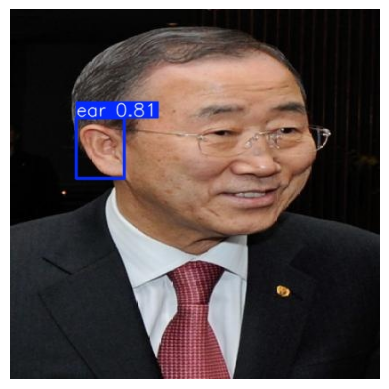

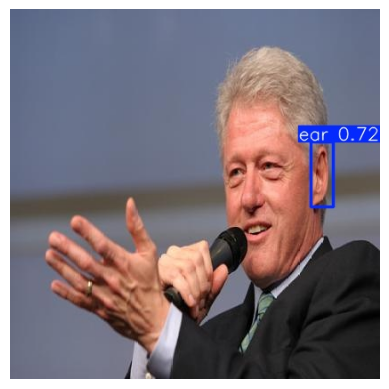

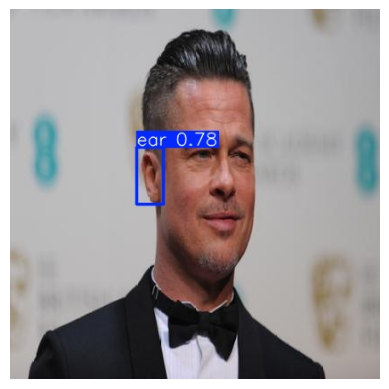

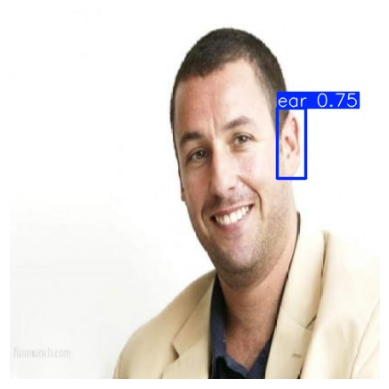

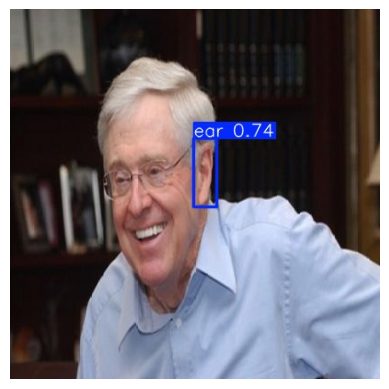

In [27]:
# Afficher une image prédite
# predicted_images = sorted(glob('runs/detect/ear_detection23/*.jpg'))  # runs/detect/predict
predicted_images = sorted(glob('runs/detect/predict/*'))

for img_path in predicted_images[:5]:  # Afficher les 5 premières images
    img = cv2.imread(img_path)[:, :, ::-1]  # Convertir BGR -> RGB
    plt.imshow(img)
    plt.axis('off')
    plt.show()

SAUVEGARDER LE MODELE

In [47]:
# Télécharger le meilleur modèle
from IPython.display import FileLink
best_model_path = 'runs/detect/ear_detection/weights/best.pt'
FileLink(best_model_path)

/kaggle/working/runs/detect/ear_detection/weights/best.pt

## **TEST : PREDICTIONS & BOUNDING BOXES**

In [28]:
# # Charger le modèle entraîné
# trained_model_path = 'runs/detect/ear_detection/weights/best.pt'
# model = YOLO(trained_model_path)

# # Faire des prédictions sur des images de test
# test_images = glob('/kaggle/input/ear-detection-v2-dataset/test/*.jpg')  # Liste des images de test
# results = model.predict(source=test_images, conf=0.1, save=True)  # Conf = seuil de confiance

# Inspecter les bounding boxes pour chaque image
for i, result in enumerate(results):
    print(f"Image {i+1}:")
    if result.boxes is not None and len(result.boxes) > 0:
        bboxes = result.boxes.xyxy.cpu().numpy()  # Bounding boxes (x_min, y_min, x_max, y_max)
        confs = result.boxes.conf.cpu().numpy()  # Scores de confiance
        print("Bounding boxes :", bboxes)
        print("Confidences :", confs)
    else:
        print("Aucune bounding box détectée.")

Image 1:
Bounding boxes : [[     260.08      134.06      281.94      209.71]]
Confidences : [    0.70754]
Image 2:
Bounding boxes : [[     247.93      133.35      300.35      231.87]]
Confidences : [    0.83931]
Image 3:
Bounding boxes : [[     276.63       203.9      303.21      256.71]]
Confidences : [    0.79603]
Image 4:
Bounding boxes : [[     134.19       135.4       161.7      235.07]]
Confidences : [    0.66409]
Image 5:
Bounding boxes : [[     43.994      155.79      77.525      219.94]]
Confidences : [    0.77869]
Image 6:
Bounding boxes : [[     74.003      122.93      128.57      190.22]]
Confidences : [    0.81144]
Image 7:
Bounding boxes : [[     142.49      155.85      172.14      219.99]]
Confidences : [    0.78254]
Image 8:
Bounding boxes : [[     103.71      132.78       134.3       219.3]
 [     292.55      148.33       316.9      228.68]]
Confidences : [       0.72     0.67497]
Image 9:
Bounding boxes : [[     253.28      94.616      276.11      144.17]]
Confidences

In [29]:
# Créer un dossier pour les annotations
os.makedirs('predicted_boxes', exist_ok=True)

# Sauvegarder les bounding boxes
for i, result in enumerate(results):
    bboxes_file = f'predicted_boxes/image_{i+1}_bboxes.txt'
    if result.boxes is not None and len(result.boxes) > 0:
        bboxes = result.boxes.xyxy.cpu().numpy()  # Bounding boxes
        confs = result.boxes.conf.cpu().numpy()  # Scores
        output = np.hstack((bboxes, confs.reshape(-1, 1)))  # Combiner bboxes et scores
        np.savetxt(bboxes_file, output, fmt='%.2f', header='x_min, y_min, x_max, y_max, confidence')
        print(f"Bounding boxes sauvegardées dans : {bboxes_file}")
    else:
        print(f"Aucune bounding box détectée pour l'image {i+1}.")

Bounding boxes sauvegardées dans : predicted_boxes/image_1_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_2_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_3_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_4_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_5_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_6_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_7_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_8_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_9_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_10_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_11_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_12_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_13_bboxes.txt
Bounding boxes sauvegardées dans : predicted_boxes/image_14_bboxes.txt
Bounding boxes 

In [32]:
# !zip -r /kaggle/working/test_predicted_boxes.zip /kaggle/working/predicted_boxes/

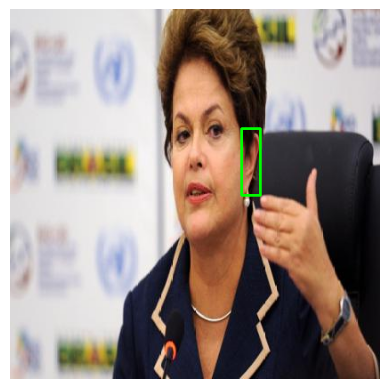

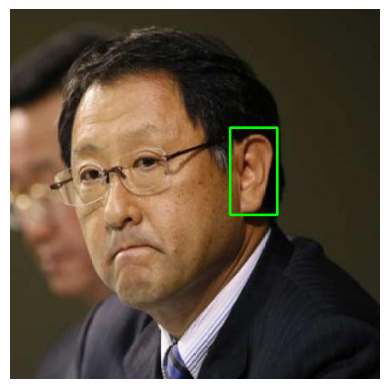

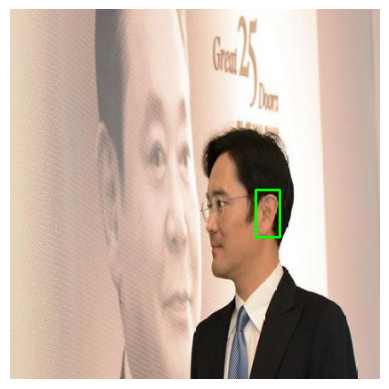

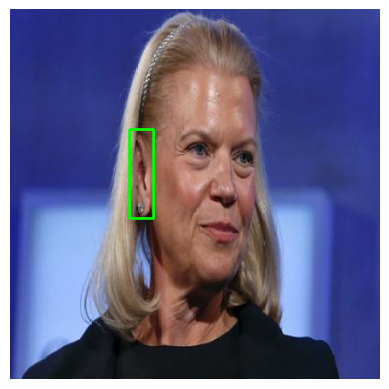

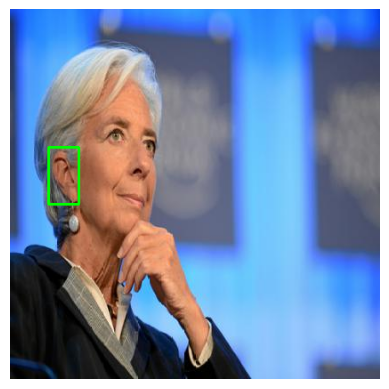

...

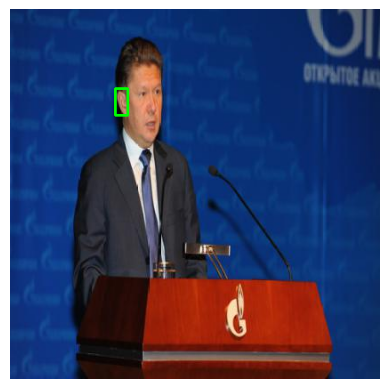

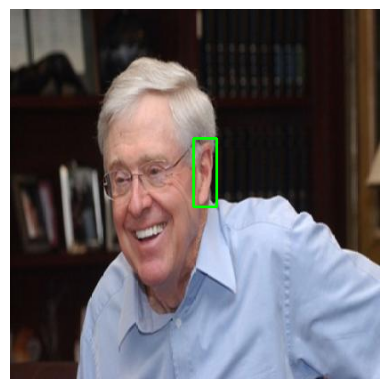

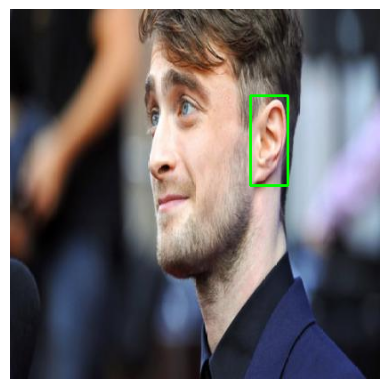

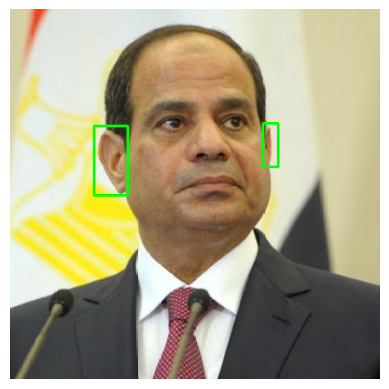

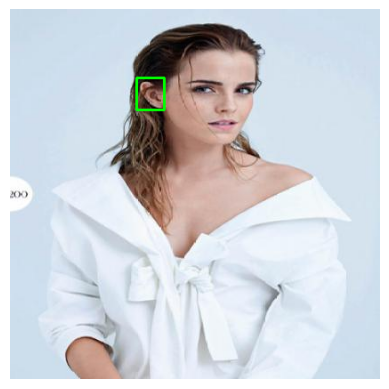

In [30]:
# Visualiser les résultats
for i, result in enumerate(results):
    img_path = test_images[i]
    img = cv2.imread(img_path)  # Charger l'image originale
    if result.boxes is not None and len(result.boxes) > 0:
        bboxes = result.boxes.xyxy.cpu().numpy()  # Bounding boxes
        for bbox in bboxes:
            x_min, y_min, x_max, y_max = map(int, bbox)
            cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)  # Dessiner la bounding box

    # Afficher l'image avec les bounding boxes
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

In [34]:
bboxes

array([[     142.49,      77.921,      173.27,      113.58]], dtype=float32)

## **TEST : DETECTION EN TEMPS REEL**

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


In [20]:
# Recharger les fichiers
drive.mount('/content/drive', force_remount=True)

# S'assurer que le data.yml est bien sur le drive
print(os.path.exists('/content/drive/MyDrive/PFE_database/data.yaml'))

Mounted at /content/drive
True


In [ ]:
# !cp /content/drive/MyDrive/PFE_database/archive/labels/train/*.txt /content/drive/MyDrive/PFE_database/archive/train/
# !cp /content/drive/MyDrive/PFE_database/archive/labels/val/*.txt /content/drive/MyDrive/PFE_database/archive/val/

**TRAINING**

In [ ]:
!rm /content/drive/MyDrive/PFE_database/archive/train.cache
!rm /content/drive/MyDrive/PFE_database/archive/val.cache

rm: cannot remove '/content/drive/MyDrive/PFE_database/archive/train.cache': No such file or directory
rm: cannot remove '/content/drive/MyDrive/PFE_database/archive/val.cache': No such file or directory


Déplacer les labels dans le dossier ou on a les images...

In [ ]:
!python train.py --img 640 --batch 16 --epochs 50 --data /content/drive/MyDrive/PFE_database/data.yaml --weights yolov5s.pt

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-12-15 18:25:32.069664: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-15 18:25:32.089455: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-15 18:25:32.095434: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visua

In [ ]:
# runs/train/exp/weights/best.pt    # chemin en output vers le modèle avec la meilleure perf sur les données
# runs/train/exp/weights/last.pt    # le dernier modèle sauvegardé à la fin de l'entrainement

**EVALUATION**

In [ ]:
!python val.py --weights runs/train/exp/weights/best.pt --data /content/drive/MyDrive/PFE_database/data.yaml --img 640

val: data=/content/drive/MyDrive/PFE_database/data.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-389-ge62a31b6 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/drive/MyDrive/PFE_database/archive/val.cache... 47 images, 0 backgrounds, 0 corrupt: 100% 47/47 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 2/2 [00:22<00:00, 11.26s/it]
                   all         47         47      0.746      0.617      0.689      0.364
Speed: 0.2ms pre-process, 7.9ms inference, 27.6ms NMS per image at shape (32, 3, 640,

**TEST**

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --source /content/drive/MyDrive/PFE_database/archive/val/

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/PFE_database/archive/val/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-389-ge62a31b6 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/47 /content/drive/MyDrive/PFE_database/archive/val/1.jpg: 640x512 2 ears, 29.0ms
image 2/47 /content/drive/MyDrive/PFE_database/archive/val/10.jpg: 640x448 (no detections), 29.4ms
image 3/47 /content/drive/MyDrive/PFE_database/archive/

**EXPORT DU MODELE**

In [ ]:
!python export.py --weights runs/train/exp/weights/best.pt --include onnx

export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, cache=, simplify=False, mlmodel=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v7.0-389-ge62a31b6 Python-3.10.12 torch-2.5.1+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 25200, 6) (13.7 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 288.2 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 5.9s, installed 1 package: ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX

In [113]:
# model = torch.hub.load('ultralytics/yolov5', 'custom', 'runs/train/exp/weights/best.onnx')

In [43]:
# model = YOLO(best_model_path)  # Chargement du modèle YOLOv8
# print("Modèle YOLOv8 chargé avec succès.")

**VIDEO TEMPS REEL**
> En local

In [142]:
# # A tester en local 
# # Chargement du modèle YOLOv8
# model_path = 'C:\\Users\\leila\\Documents\\EFREI\\PROJET FIN DETUDE\\RESULTS\\ex1_yolov8_m\\50_epochs\\best.pt'  # Chemin vers votre modèle YOLOv8 entraîné
# model = YOLO(model_path)

# # Capture du flux vidéo (0 pour webcam, ou chemin vers un fichier vidéo)
# cap = cv2.VideoCapture(0)  # Utilise la webcam

# while True:
#     ret, frame = cap.read()
#     if not ret:
#         break

#     # Détection
#     results = model(frame)
#     annotated_frame = results[0].plot()  # YOLOv8 offre une fonction .plot() pour dessiner les boxes

#     # Affichage de l'image annotée
#     cv2.imshow("Ear Detection - Real Time", annotated_frame)

#     # Appuyer sur 'q' pour quitter
#     if cv2.waitKey(1) & 0xFF == ord('q'):
#         break

# cap.release()
# cv2.destroyAllWindows()

## **5. COMBINAISON AVEC LE MODELE DES LANDMARKS**

In [37]:
# Charger le modèle de landmarks
landmarks_path = '/kaggle/input/landmarks_detection_model/tensorflow2/default/1/my_model.h5'
landmark_model = load_model(landmarks_path)

In [38]:
# Fonction pour préparer une image d'entrée
def prepare_landmark_input(img, bbox):
    """
    Recadre et prépare une image à partir d'une bounding box pour le modèle de landmarks.
    """
    x_min, y_min, x_max, y_max = map(int, bbox)
    cropped_img = img[y_min:y_max, x_min:x_max]  # Recadrer l'image

    # Convertir en noir et blanc
    gray_img = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2GRAY)
    resized_img = cv2.resize(gray_img, (224, 224))  # Redimensionner à 224x224

    # Normaliser les pixels entre 0 et 1
    normalized_img = resized_img / 255.0

    # Ajouter les dimensions nécessaires pour le modèle Keras
    input_img = np.expand_dims(normalized_img, axis=(0, -1))  # (1, 224, 224, 1)
    return input_img


### PIPELINE COMPLET POUR L'INTEGRATION 


0: 640x640 1 ear, 22.0ms
1: 640x640 1 ear, 22.0ms
2: 640x640 1 ear, 22.0ms
3: 640x640 1 ear, 22.0ms
4: 640x640 1 ear, 22.0ms
5: 640x640 1 ear, 22.0ms
6: 640x640 1 ear, 22.0ms
7: 640x640 2 ears, 22.0ms
8: 640x640 1 ear, 22.0ms
9: 640x640 1 ear, 22.0ms
10: 640x640 1 ear, 22.0ms
11: 640x640 1 ear, 22.0ms
12: 640x640 1 ear, 22.0ms
13: 640x640 1 ear, 22.0ms
14: 640x640 1 ear, 22.0ms
15: 640x640 1 ear, 22.0ms
16: 640x640 2 ears, 22.0ms
17: 640x640 1 ear, 22.0ms
18: 640x640 3 ears, 22.0ms
19: 640x640 1 ear, 22.0ms
20: 640x640 1 ear, 22.0ms
21: 640x640 1 ear, 22.0ms
22: 640x640 1 ear, 22.0ms
23: 640x640 1 ear, 22.0ms
24: 640x640 1 ear, 22.0ms
25: 640x640 2 ears, 22.0ms
26: 640x640 1 ear, 22.0ms
Speed: 3.3ms preprocess, 22.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Traitement de l'image 1: /kaggle/input/ear-detection-v2-dataset/test/0130_png.rf.5ac90ebfe93070a601372670f606e751.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


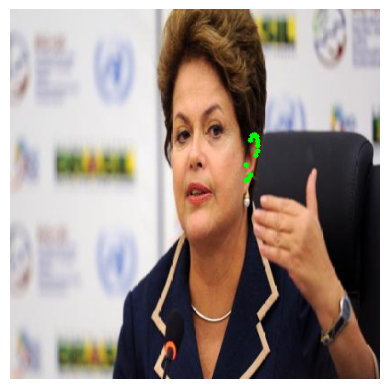

Traitement de l'image 2: /kaggle/input/ear-detection-v2-dataset/test/0100_png.rf.145673e69650fcf61745c44f753f7a87.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


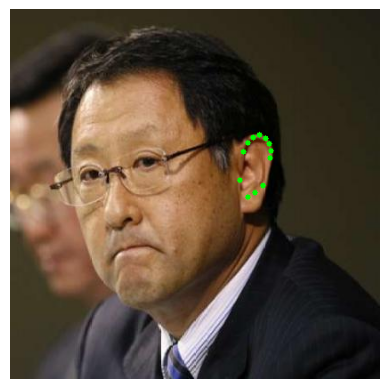

Traitement de l'image 3: /kaggle/input/ear-detection-v2-dataset/test/0297_png.rf.0b66455b2aa889be60f06446a6ca80a1.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


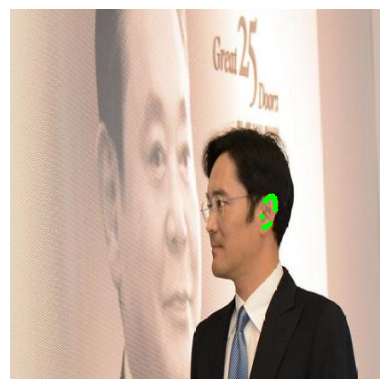

Traitement de l'image 4: /kaggle/input/ear-detection-v2-dataset/test/0224_png.rf.6381648d6678fdf7d4c9279c6b033d43.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


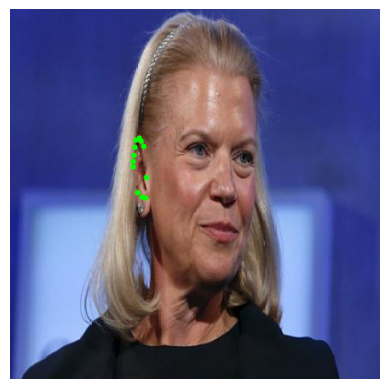

Traitement de l'image 5: /kaggle/input/ear-detection-v2-dataset/test/0079_png.rf.48328d71e40cbb59d8bcece876d00712.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


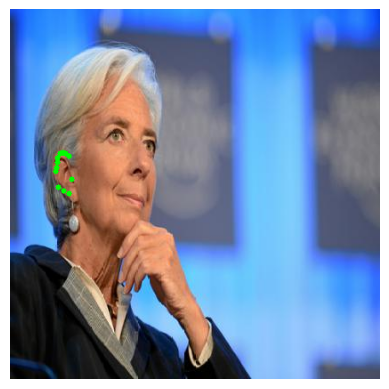

Traitement de l'image 6: /kaggle/input/ear-detection-v2-dataset/test/0005_png.rf.92e00517f6f0678906994e59eefa2b3d.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


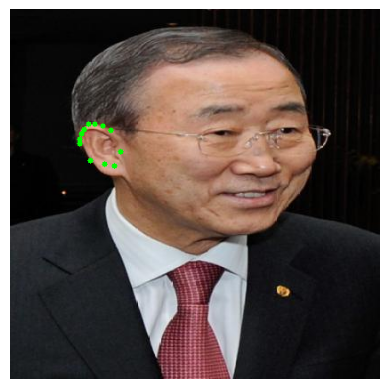

Traitement de l'image 7: /kaggle/input/ear-detection-v2-dataset/test/0051_png.rf.bdac5b8c6c99a12c71eb605848c20139.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


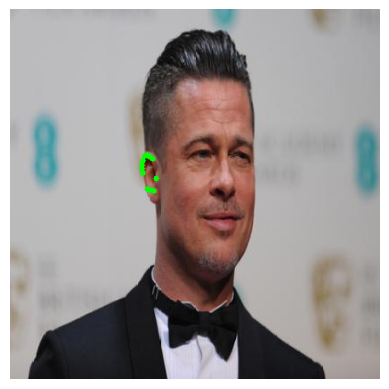

Traitement de l'image 8: /kaggle/input/ear-detection-v2-dataset/test/0221_png.rf.fd34f8cce63980f05c008bfcd2bd0396.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


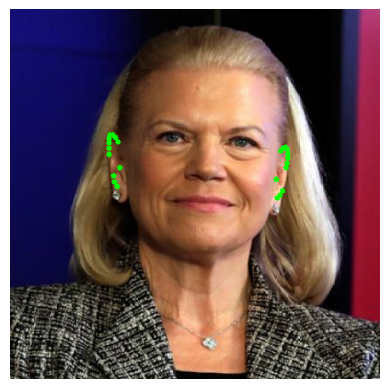

Traitement de l'image 9: /kaggle/input/ear-detection-v2-dataset/test/0249_png.rf.a929e931ed882c17490756029f6bf97d.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


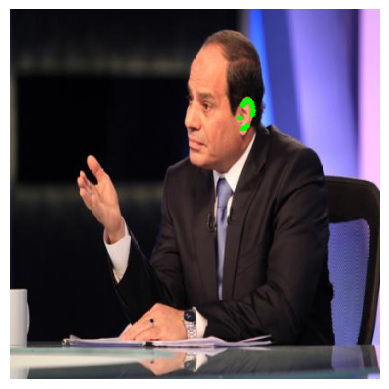

Traitement de l'image 10: /kaggle/input/ear-detection-v2-dataset/test/0277_png.rf.627ea5928d96a5bfa097014ec527ba30.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


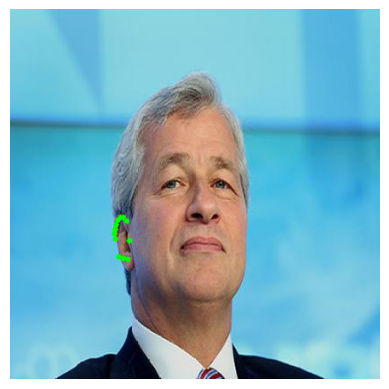

Traitement de l'image 11: /kaggle/input/ear-detection-v2-dataset/test/0026_png.rf.10a755ccf26f0c7fa57b8b96ef54b56b.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


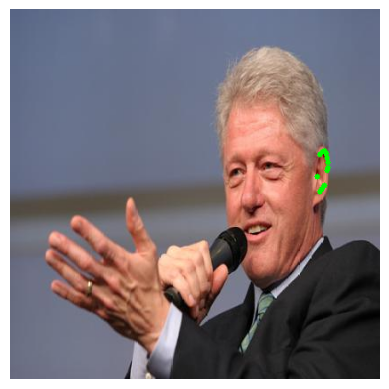

Traitement de l'image 12: /kaggle/input/ear-detection-v2-dataset/test/0098_png.rf.12fdcd962724e809ebe9b903d8a5677a.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


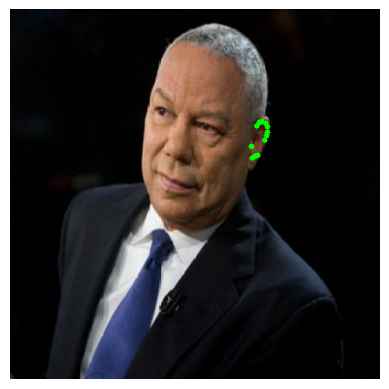

Traitement de l'image 13: /kaggle/input/ear-detection-v2-dataset/test/0066_png.rf.b799ada63b735f7ef98e3a240c43eb19.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


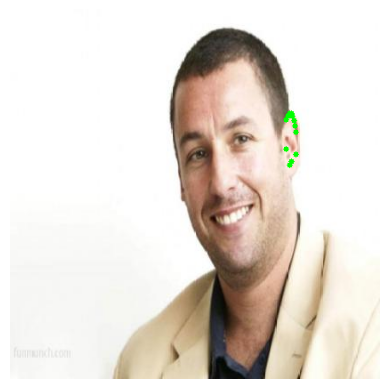

Traitement de l'image 14: /kaggle/input/ear-detection-v2-dataset/test/0183_png.rf.10a6d65130d37f17caec181bcd6d8d3d.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


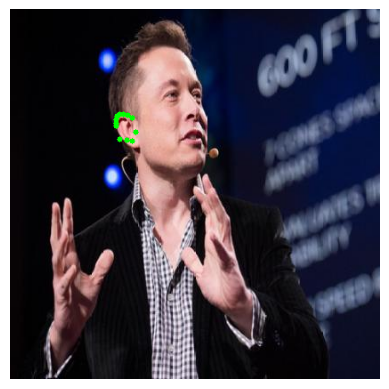

Traitement de l'image 15: /kaggle/input/ear-detection-v2-dataset/test/0260_png.rf.bc5b026f6000179308f6d6f9a06cfffc.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


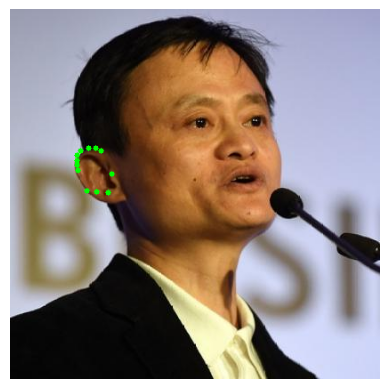

Traitement de l'image 16: /kaggle/input/ear-detection-v2-dataset/test/0072_png.rf.4fcee2e00a87db666cfac343f50c444e.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


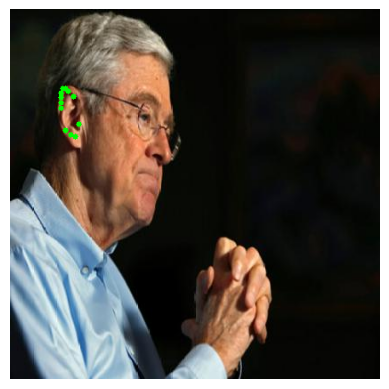

Traitement de l'image 17: /kaggle/input/ear-detection-v2-dataset/test/0225_png.rf.03c162e6600e5104b6cb993be99d7bdb.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


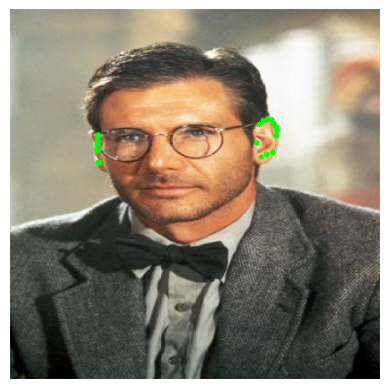

Traitement de l'image 18: /kaggle/input/ear-detection-v2-dataset/test/0256_png.rf.4dcc45342e6e57c115b19ecd30a4a6f8.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


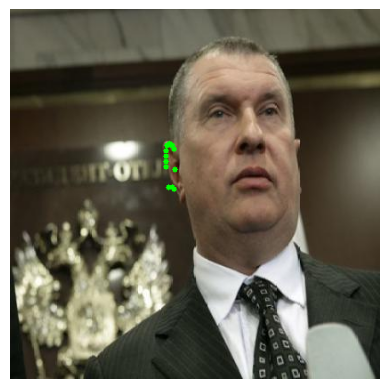

Traitement de l'image 19: /kaggle/input/ear-detection-v2-dataset/test/0132_png.rf.3aa40d11654569372b0027824b66922d.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


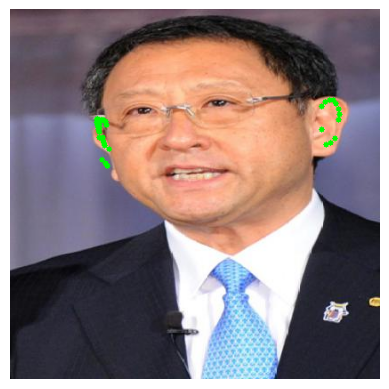

Traitement de l'image 20: /kaggle/input/ear-detection-v2-dataset/test/0227_png.rf.6b9e511d3f8dc12ec48115ece8ba6794.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


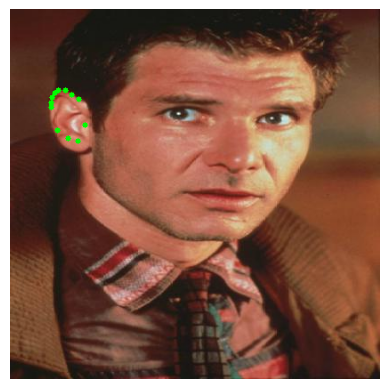

Traitement de l'image 21: /kaggle/input/ear-detection-v2-dataset/test/0101_png.rf.d7445e20c64ad3c530a35da2170fd9de.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


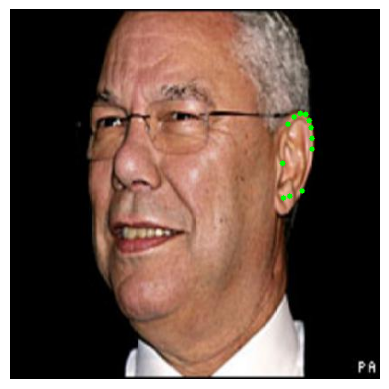

Traitement de l'image 22: /kaggle/input/ear-detection-v2-dataset/test/0173_png.rf.be0297687a3aa1ec1be98f89fbd43a55.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


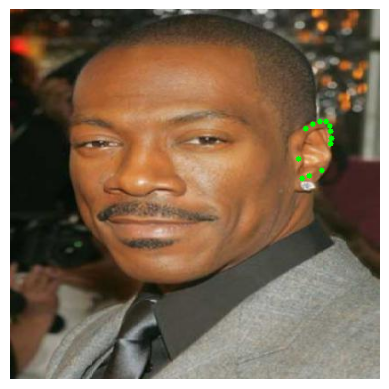

Traitement de l'image 23: /kaggle/input/ear-detection-v2-dataset/test/0240_png.rf.d67f77295ccd0f0eb4ab1f1731cc698f.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


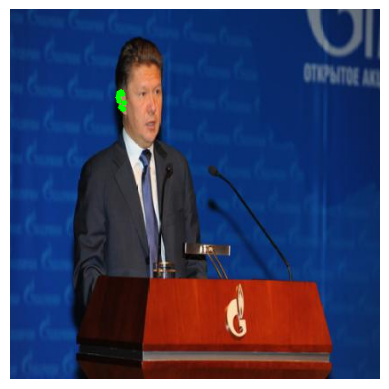

Traitement de l'image 24: /kaggle/input/ear-detection-v2-dataset/test/0067_png.rf.882356ecbb6a91951ca844b4cef7e165.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


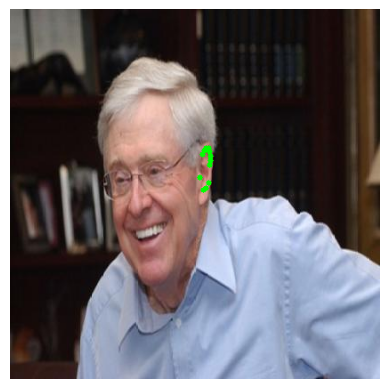

Traitement de l'image 25: /kaggle/input/ear-detection-v2-dataset/test/0107_png.rf.705d103cd515333f0cd0a3d211cf35da.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


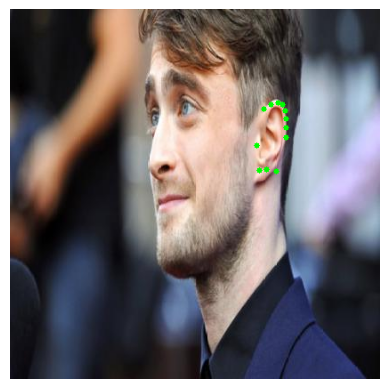

Traitement de l'image 26: /kaggle/input/ear-detection-v2-dataset/test/0166_png.rf.1e73e8a6ff85b77fdf14afe788cab72e.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


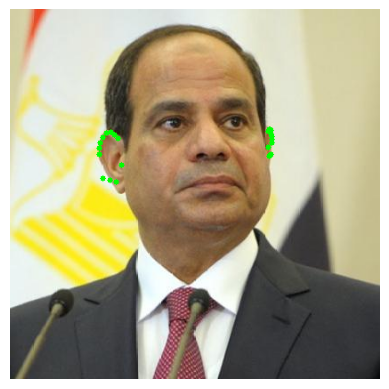

Traitement de l'image 27: /kaggle/input/ear-detection-v2-dataset/test/0191_png.rf.f1fc7d70c5c1ff13c806ac24a8a16b95.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


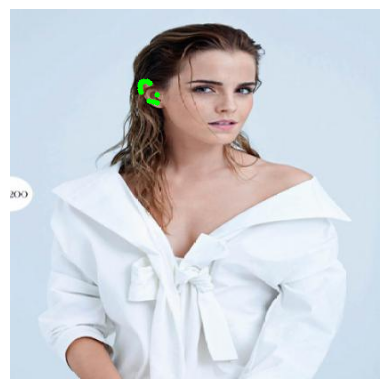

In [42]:
# Charger les images de test
test_images = glob('/kaggle/input/ear-detection-v2-dataset/test/*.jpg')  # Liste des images de test

# Faire des prédictions avec YOLOv8
results = yolo_model.predict(source=test_images, conf=0.1)

# Parcourir les résultats pour chaque image
for i, (img_path, result) in enumerate(zip(test_images, results)):
    print(f"Traitement de l'image {i+1}: {img_path}")
    img = cv2.imread(img_path)  # Charger l'image originale
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Si des bounding boxes sont détectées
    if result.boxes is not None and len(result.boxes) > 0:
        bboxes = result.boxes.xyxy.cpu().numpy()  # Récupérer les bounding boxes
        
        for bbox in bboxes:
            # Étape 1 : Préparer l'image pour les landmarks
            input_img = prepare_landmark_input(img, bbox)

            # Étape 2 : Prédire les landmarks
            landmarks = landmark_model.predict(input_img)  # Sortie : (1, 24)
            landmarks = landmarks[0]  # Extraire les 24 valeurs

            # Étape 3 : Convertir les landmarks en coordonnées globales
            for j in range(12):  # 12 points clés
                x = int(bbox[0] + landmarks[j] * (bbox[2] - bbox[0]))  # Échelle globale
                y = int(bbox[1] + landmarks[j + 12] * (bbox[3] - bbox[1]))
                cv2.circle(img, (x, y), 3, (0, 255, 0), -1)  # Dessiner les points

    else:
        print("Aucune bounding box détectée pour cette image.")

    # Afficher l'image avec les bounding boxes et landmarks
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
